In [33]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import muon as mu
import anndata as ad
from muon import prot as pt
import squidpy as sq
import scanpy as sc
import plotnine as p9

In [34]:
import liana as li
from liana.method import MistyData
li.__version__

'1.0.0a0'

In [35]:
rna_path = "data/GSE213264/GSM6578062_humantonsil_RNA.tsv.gz"
prot_path = "data/GSE213264/GSM6578071_humantonsil_protein.tsv.gz"
barcodes_to_match_path = "ab_matching/barcode_to_match.csv"

In [36]:
rna = pd.read_csv(rna_path, sep="\t")
prot_orig = pd.read_csv(prot_path, sep="\t")
prot = prot_orig.copy()
prot_orig.columns = [re.sub("\\.[AGCT]{15}", "", s) for s in prot_orig.columns]
assert set(rna.X) == set(prot.X)

rna = rna.set_index("X")
prot = prot.set_index("X")
prot_orig = prot_orig.set_index("X")
prot = prot.loc[rna.index]
prot_orig = prot_orig.loc[rna.index]
assert np.all(rna.index == prot.index)
assert np.all(rna.index == prot_orig.index)

In [37]:
# get coordinates
def get_coord(col):
    x_coord = [s.split("x")[0] for s in col]
    y_coord = [s.split("x")[1] for s in col]
    df_coord = pd.DataFrame({"x": x_coord, "y": y_coord})
    df_coord = df_coord.apply(pd.to_numeric)
    return df_coord
coord = get_coord(rna.index)

obs_df = rna.index.to_frame(name="name")
obs_df["x"] = coord["x"].to_numpy()
obs_df["y"] = coord["y"].to_numpy()

spatial = obs_df.copy().loc[:, ["x", "y"]]
spatial

,x,y
X,,
29x42,29,42
44x36,44,36
34x6,34,6
42x19,42,19
41x6,41,6
...,...,...
2x26,2,26
30x26,30,26
23x48,23,48


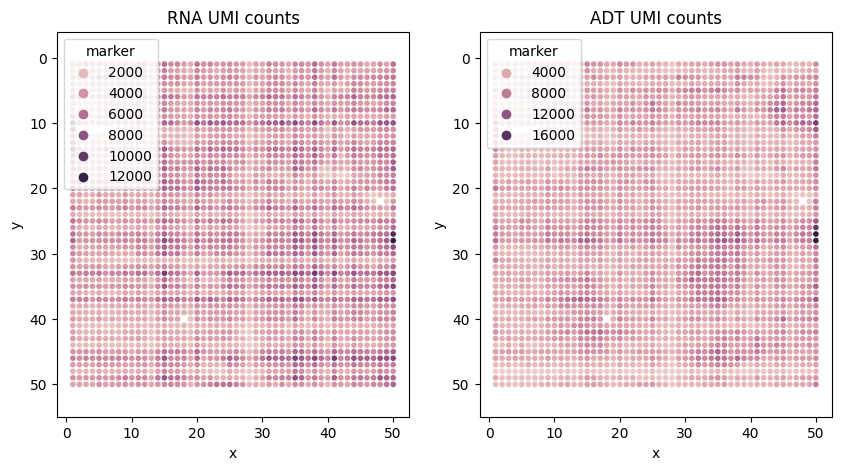

In [38]:
# QC plots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

plot_df = spatial.copy()
plot_df["marker"] = rna.sum(axis=1)
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=20)
axs[0].axis('equal')
axs[0].invert_yaxis()
axs[0].set_title("RNA UMI counts")

plot_df = spatial.copy()
plot_df["marker"] = prot_orig.sum(axis=1)
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=20)
axs[1].axis('equal')
axs[1].invert_yaxis()
axs[1].set_title("ADT UMI counts")
plt.show()

In [39]:
# remove spike ins from rna
print(rna.shape)
spike_bool = np.array(["ERCC" in c for c in rna.columns])
print(spike_bool.sum())
rna = rna.loc[:,~spike_bool]
print(rna.shape)

# remove unmapped from protein
print(prot.shape)
unmapped_bool = np.array(["unmapped" in c for c in prot.columns])
print(unmapped_bool.sum())
prot = prot.loc[:,~unmapped_bool]
print(prot.shape)

(2492, 28417)
29
(2492, 28388)
(2492, 283)
1
(2492, 282)


In [40]:
# TODO: Should we normalize by library size before or after removing spike ins?
# TODO: Should we normalize by library size before or after removing unmapped?
# divide each spot by library size
rna = rna.div(rna.sum(axis=1), axis=0) * 10_000
prot = prot.div(prot.sum(axis=1), axis=0) * 10_000

9999.999999999967
9999.999999999254


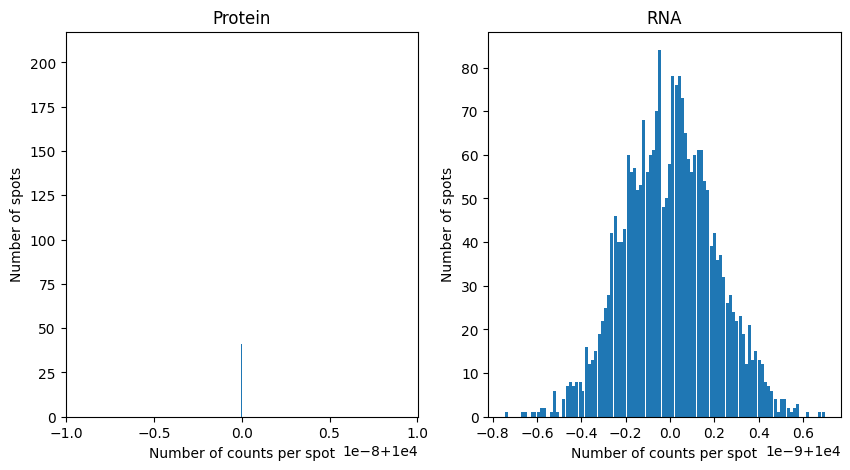

In [44]:
# check the number of counts per spot
print(prot.sum(axis=1).min())
print(rna.sum(axis=1).min())

# plot the histograms
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].hist(prot.sum(axis=1), bins=100)
ax[0].set_xlabel('Number of counts per spot')
ax[0].set_ylabel('Number of spots')
ax[0].set_title('Protein')
ax[1].hist(rna.sum(axis=1), bins=100)
ax[1].set_xlabel('Number of counts per spot')
ax[1].set_ylabel('Number of spots')
ax[1].set_title('RNA')
plt.show()

In [45]:
# rename the columns
barcode_to_match = pd.read_csv(barcodes_to_match_path, skiprows=1, header=None, names=["barcode", "match"])
barcode_to_match = dict(zip(barcode_to_match.barcode, barcode_to_match.match))
prot.columns = np.array([re.search("[AGCT]{15}|unmapped", s).group() for s in prot.columns])
prot = prot.loc[:, list(barcode_to_match.keys())]
prot.columns = [barcode_to_match[k] for k in prot.columns]
prot

,CD1D,TNFRSF14,CD34,NCR1,CCR3,KIT,TNFRSF18,TNFRSF13C,TNFSF4,LAG3,...,MICA,KLRF1,LTBR,ANXA1,CD74,BST2,CSF2RA,TNF,IL15RA,F11R
X,,,,,,,,,,,,,,,,,,,,,
29x42,0.000000,39.525692,13.175231,2.635046,42.160738,7.905138,34.255599,2.635046,5.270092,60.606061,...,10.540184,5.270092,13.175231,5.270092,824.769433,13.175231,18.445323,5.270092,13.175231,52.700922
44x36,0.000000,77.294686,12.077295,0.000000,41.062802,12.077295,41.062802,12.077295,9.661836,31.400966,...,36.231884,9.661836,33.816425,4.830918,594.202899,9.661836,4.830918,0.000000,12.077295,16.908213
34x6,0.000000,57.158410,10.887316,2.721829,35.383778,5.443658,38.105607,5.443658,2.721829,29.940120,...,13.609145,8.165487,35.383778,2.721829,743.059336,10.887316,19.052803,5.443658,19.052803,48.992923
42x19,0.000000,45.395590,3.242542,0.000000,32.425422,19.455253,29.182879,3.242542,6.485084,16.212711,...,19.455253,6.485084,19.455253,3.242542,638.780804,6.485084,16.212711,0.000000,9.727626,100.518807
41x6,0.000000,38.817557,8.957898,2.985966,20.901762,11.943864,44.789489,0.000000,2.985966,17.915796,...,17.915796,11.943864,20.901762,5.971932,812.182741,5.971932,11.943864,0.000000,20.901762,47.775455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2x26,2.292001,34.380014,11.460005,0.000000,27.504011,6.876003,41.256017,6.876003,6.876003,25.212010,...,11.460005,11.460005,16.044006,0.000000,738.024295,6.876003,11.460005,4.584002,11.460005,38.964016
30x26,0.000000,39.598733,13.199578,0.000000,23.759240,10.559662,42.238648,5.279831,5.279831,26.399155,...,13.199578,5.279831,39.598733,2.639916,731.256600,13.199578,15.839493,5.279831,13.199578,39.598733
23x48,0.000000,13.869626,20.804438,0.000000,20.804438,27.739251,13.869626,0.000000,0.000000,6.934813,...,6.934813,6.934813,48.543689,0.000000,339.805825,0.000000,27.739251,0.000000,13.869626,20.804438


In [46]:
# QC: Remove everything with less than 10 counts
prot_to_remove = prot.columns.to_numpy()[prot.sum(axis=0) < 10]
print(prot_to_remove.shape)
prot = prot.loc[:, [s for s in prot.columns if s not in prot_to_remove]]

rna_to_remove = rna.columns.to_numpy()[rna.sum(axis=0) < 10]
print(rna_to_remove.shape)
rna = rna.loc[:, [s for s in rna.columns if s not in rna_to_remove]]

(0,)
(8392,)


In [47]:
# get ligand receptor DB
#li.rs.show_resources()
db = li.rs.select_resource("consensus")
print(db.shape)

# NOTE: We remove rows that contain genes that are annotated as both receptors and ligands
ligands_orig = np.unique(db.ligand.to_numpy())
receptors_orig = np.unique(db.receptor.to_numpy())
ligands = np.array(list(set(ligands_orig) - (set(ligands_orig) & set(receptors_orig))))
receptors = np.array(list(set(receptors_orig) - (set(ligands_orig) & set(receptors_orig))))
db_subset = db.loc[np.logical_and(np.array([s in receptors for s in db.receptor.to_numpy()]),
                                    np.array([s in ligands for s in db.ligand.to_numpy()]))]
print(db_subset.shape)

# subset DB for rows that are present in our ADT data (so either ligand or receptor is present)
db_subset = db_subset.loc[np.logical_or(np.array([s in prot.columns for s in db_subset.receptor.to_numpy()]),
                                 np.array([s in prot.columns for s in db_subset.ligand.to_numpy()]))]
print(db_subset.shape)

# subset DB for rows that are present in our rna data (so either ligand or receptor is present)
db_subset = db_subset.loc[np.logical_and(np.array([s in rna.columns for s in db_subset.receptor.to_numpy()]),
                                 np.array([s in rna.columns for s in db_subset.ligand.to_numpy()]))]
print(db_subset.shape)
db_subset

(4701, 2)
(4388, 2)
(918, 2)
(631, 2)


,ligand,receptor
0,LGALS9,PTPRC
1,LGALS9,MET
2,LGALS9,CD44
3,LGALS9,LRP1
5,LGALS9,PTPRK
...,...,...
4679,MIA,ITGA4
4685,CSF1,CSF2RA
4686,CSF3,CSF2RA
4688,MAML2,NOTCH3


In [48]:
# how many ligands and receptors to we retain in the end?
all_genes_in_db = list(set(db_subset.ligand.to_list() + db_subset.receptor.to_list()))
print(len(set(db_subset.ligand.to_list())))
print(len(set(db_subset.receptor.to_list())))
print(len(all_genes_in_db))

314
185
499


In [49]:
# get misty predictor and target sets
misty_predictors = np.array(all_genes_in_db)[[np.any(s == np.array(prot.columns)) for s in all_genes_in_db]]
misty_targets = np.array(list(set(all_genes_in_db) - set(misty_predictors)))
print(misty_predictors.shape, misty_targets.shape)

# check that misty targets (genes with ADT) and misty predictors have no overlap
assert set(list(misty_predictors)) & set(list(misty_targets)) == set()
assert len(set(db_subset.ligand.to_list() + db_subset.receptor.to_list())) == len(set(misty_predictors) | set(misty_targets))

(148,) (351,)


In [50]:
# make the adata obejcts
prot_predictor = prot.loc[:, misty_predictors]
rna_predictor = rna.loc[:, misty_predictors]
rna_target = rna.loc[:, misty_targets]

rna_target_ad = ad.AnnData(X=rna_target.to_numpy(), var=rna_target.columns.to_frame(name="mRNA"), obs=rna_target.index.to_frame(name="id"), obsm={"spatial": spatial})
rna_predictor_ad = ad.AnnData(X=rna_predictor.to_numpy(), var=rna_predictor.columns.to_frame(name="mRNA"), obs=rna_predictor.index.to_frame(name="id"), obsm={"spatial": spatial})
prot_predictor_ad = ad.AnnData(X=prot_predictor.to_numpy(), var=prot_predictor.columns.to_frame(name="protein"), obs=prot_predictor.index.to_frame(name="id"), obsm={"spatial": spatial})

print(rna_target_ad)
print(rna_predictor_ad)
print(prot_predictor_ad)

AnnData object with n_obs × n_vars = 2492 × 351
    obs: 'id'
    var: 'mRNA'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 2492 × 148
    obs: 'id'
    var: 'mRNA'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 2492 × 169
    obs: 'id'
    var: 'protein'
    obsm: 'spatial'


/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


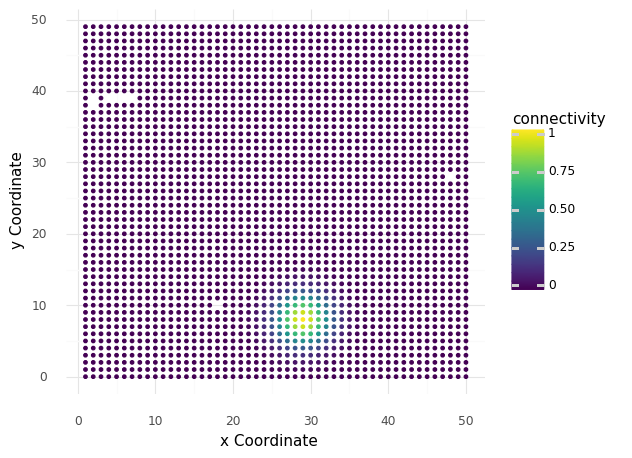

<ggplot: (703758228)>

In [51]:
# get the spatial connectivity for the paraviews (given that we bypass intra, I think it is fair to set the diagonal to 1)
li.ut.spatial_neighbors(rna_predictor_ad, cutoff=0, bandwidth=2.5, set_diag=True)
li.ut.spatial_neighbors(prot_predictor_ad, cutoff=0, bandwidth=2.5, set_diag=True)
li.pl.connectivity(rna_predictor_ad, idx=0)

In [52]:
misty = MistyData(data={"intra": rna_target_ad, "para_rna": rna_predictor_ad, "para_adt": prot_predictor_ad})
misty.var_names_make_unique() # otherwise we cannot index
misty

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:288: UserWarning: Duplicated var_names should not be present in different modalities due to the ambiguity that leads to.
/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:288: UserWarning: Duplicated var_names should not be present in different modalities due to the ambiguity that leads to.
/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:445: UserWarning: var_names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:1019: UserWarning: Modality names will be prepended to var_names since there are identical var

MuData object with n_obs × n_vars = 2492 × 668
  obs:	'id'
  3 modalities
    intra:	2492 x 351
      obs:	'id'
      var:	'mRNA'
      obsm:	'spatial'
    para_rna:	2492 x 148
      obs:	'id'
      var:	'mRNA'
      obsm:	'spatial'
      obsp:	'spatial_connectivities'
    para_adt:	2492 x 169
      obs:	'id'
      var:	'protein'
      obsm:	'spatial'
      obsp:	'spatial_connectivities'

In [19]:
print(np.asarray(misty.mod["intra"].X.sum(axis=1)).squeeze().min())
print(np.asarray(misty.mod["para_rna"].X.sum(axis=1)).squeeze().min())
print(np.asarray(misty.mod["para_adt"].X.sum(axis=1)).squeeze().min())

141.27144298688196
114.47811447811448
4240.583232077764


In [20]:
#model = ["linear", "rf"]
misty(model="linear", verbose=True, bypass_intra=True)

Now learning: intra:NTF4: 100%|██████████| 351/351 [03:31<00:00,  1.66it/s]     


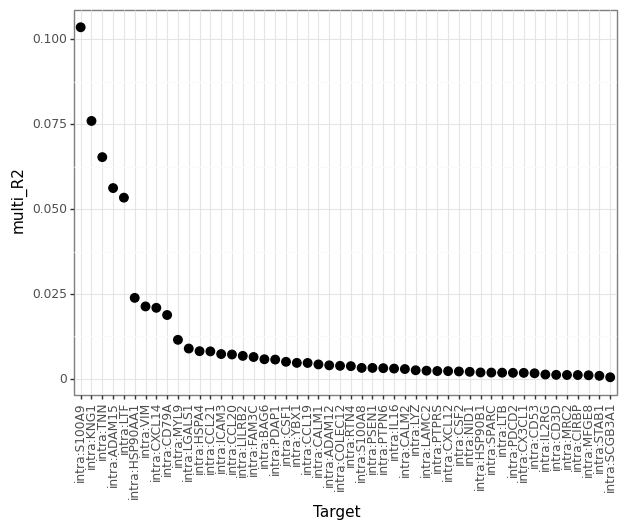

<ggplot: (688679711)>

In [21]:
stat = "multi_R2"
target_metrics = misty.uns['target_metrics'].copy()

target_metrics = target_metrics.sort_values(stat, ascending=False).head(50)

# get order of target by decreasing intra.R2
targets = target_metrics.sort_values(by=stat, ascending=False)['target'].values
# targets as categorical variable
target_metrics['target'] = pd.Categorical(target_metrics['target'],
                                            categories=targets, 
                                            ordered=True)

p = (p9.ggplot(target_metrics, p9.aes(x='target', y=stat)) +
        p9.geom_point(size=3) + 
        p9.theme_bw() +
        p9.theme(axis_text_x=p9.element_text(rotation=90),
                figure_size=(7,5)) +
    p9.labs(x='Target')
    )
p

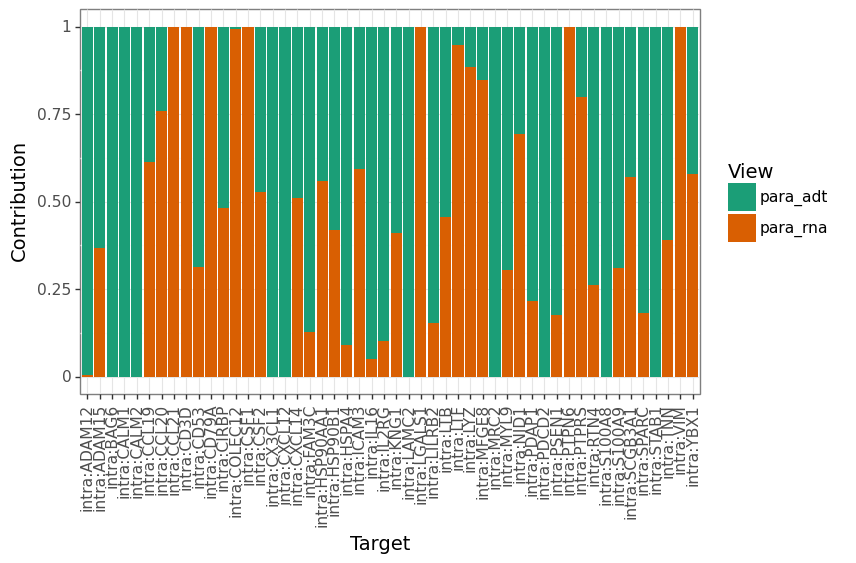

<ggplot: (680698257)>

In [22]:
target_metrics = misty.uns['target_metrics'].copy()

target_metrics = target_metrics.sort_values(stat, ascending=False).head(50)

view_names = misty.view_names.copy()
if 'intra' not in target_metrics.columns:
    view_names.remove('intra')

target_metrics = target_metrics[['target', *view_names]]
target_metrics = target_metrics.melt(id_vars='target', var_name='view', value_name='contribution')

p = (p9.ggplot(target_metrics, p9.aes(x='target', y='contribution', fill='view')) +
        p9.geom_bar(stat='identity') +
        p9.theme_bw(base_size=14) +
        p9.theme(axis_text_x=p9.element_text(rotation=90),
                    figure_size=(8,5)) +
        p9.scale_fill_brewer(palette=2, type='qual') +
        p9.labs(x='Target', y='Contribution', fill='View')
)
p

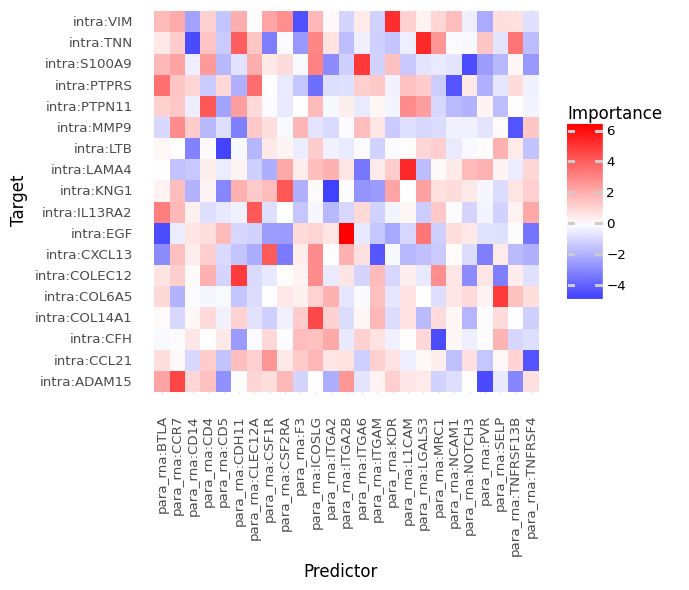

<ggplot: (693704018)>

In [23]:
(
    li.pl.interactions(misty, 'para_rna', return_fig=True, figure_size=(5, 5), top_n=25, key=abs) +
    p9.scale_fill_gradient2(low = "blue", mid = "white", high = "red", midpoint = 0) +
    p9.labs(y='Target', x='Predictor')
)

In [24]:
interactions_intra_rna = [
    ("intra:VIM", "para_rna:KDR"),
    ("intra:TNN", "para_rna:LGALS3"),
    ("intra:S100A9", "para_rna:ITGA6"),
    ("intra:LAMA4", "para_rna:L1CAM"),
    ("intra:COLEC12", "para_rna:CDH11"),
    ("intra:COL14A1", "para_rna:ICOSLG")
]

In [25]:
#interactions_intra_rna = [
#    ("intra:KNG1", "para_rna:ANXA1"),
#    ("intra:ADAM15", "para_rna:CCR7"),
#    ("intra:LTB", "para_rna:CD5"),
#    ("intra:PTPN11", "para_rna:CD4"),
#    ("intra:ADAM15", "para_rna:ITGA1"),
#    ("intra:COL6A5", "para_rna:SELP"),
#    ("intra:XCL2", "para_rna:TNFRSF9"),
#]

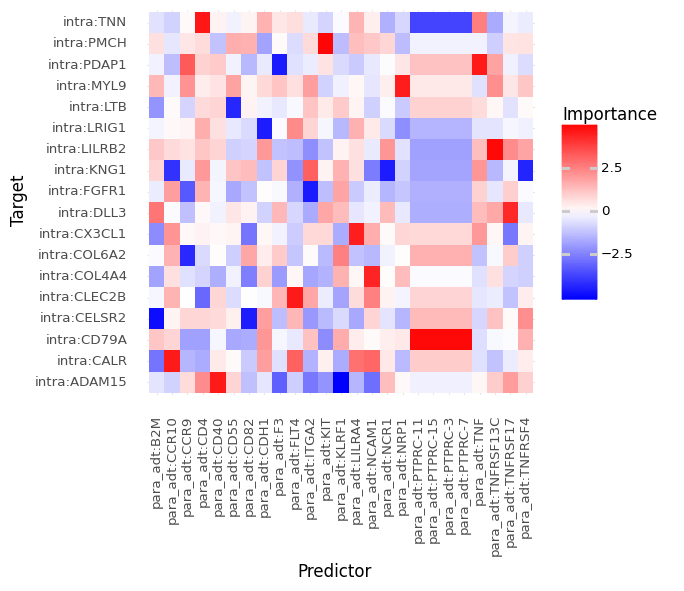

<ggplot: (682080365)>

In [26]:
(
    li.pl.interactions(misty, 'para_adt', return_fig=True, figure_size=(5, 5), top_n=25, key=abs) +
    p9.scale_fill_gradient2(low = "blue", mid = "white", high = "red", midpoint = 0) +
    p9.labs(y='Target', x='Predictor')
)

In [27]:
interactions_intra_adt = [
    ("intra:TNN", "para_adt:CD4"),
    ("intra:PMCH", "para_adt:KIT"),
    ("intra:PDAP1", "para_adt:TNF"),
    ("intra:MYL9", "para_adt:NRP1"),
    ("intra:CX3CL1", "para_adt:LILRA4"),
    ("intra:CALR", "para_adt:CCR10")
]

In [28]:
#interactions_intra_adt = [
#    ("intra:S100A9", "para_adt:CD44"),
#    ("intra:S100A9", "para_adt:PTPRC"),
#    ("intra:ADAM15", "para_adt:C5AR2"),
#    ("intra:ADAM15", "para_adt:CD44"),
#    ("intra:VIM", "para_adt:PTPRC"),
#    ("intra:TGFB1", "para_adt:CDH1")
#]

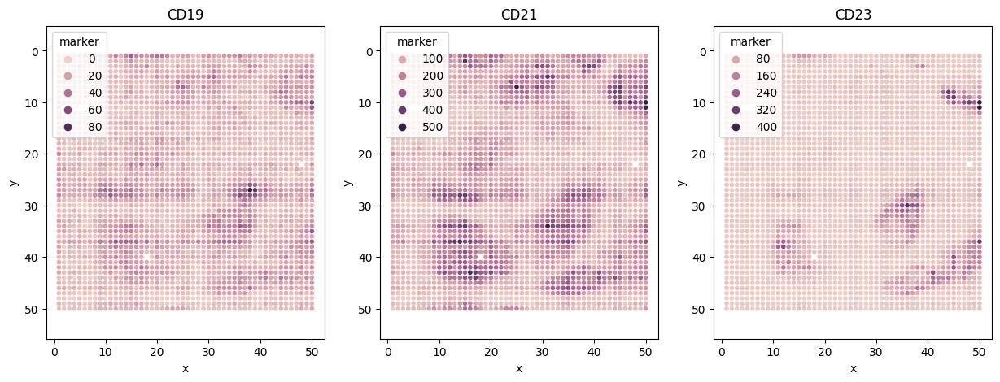

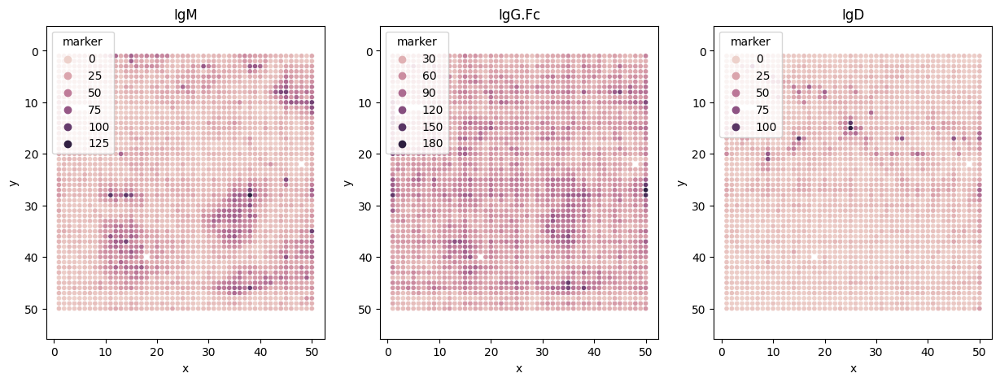

In [29]:
markers = ["CD19", "CD21", "CD23"]
fig, axs = plt.subplots(1, len(markers), figsize=(15, 5))
for i, marker in enumerate(markers):
    plot_df = coord.copy()
    plot_df["marker"] = prot_orig[marker].to_numpy()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[i], s=20)
    axs[i].axis('equal')
    axs[i].invert_yaxis()
    axs[i].set_title(marker)
plt.show()

markers = ["IgM", "IgG.Fc", "IgD"]
fig, axs = plt.subplots(1, len(markers), figsize=(15, 5))
for i, marker in enumerate(markers):
    plot_df = coord.copy()
    plot_df["marker"] = prot_orig[marker].to_numpy()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[i], s=20)
    axs[i].axis('equal')
    axs[i].invert_yaxis()
    axs[i].set_title(marker)
plt.show()

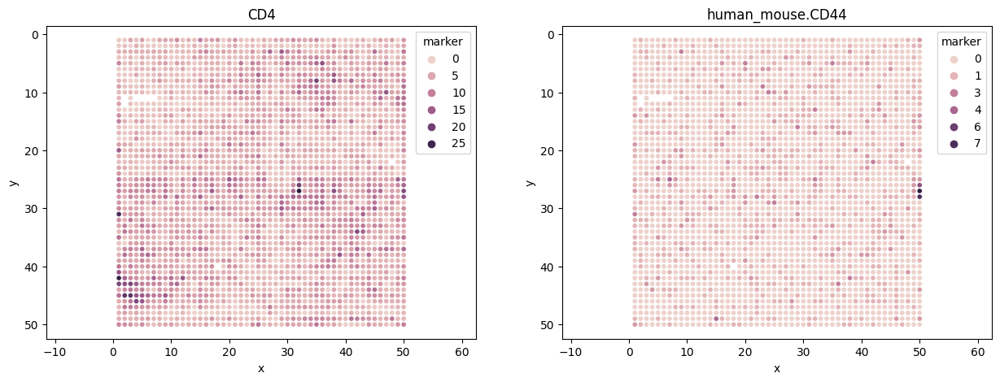

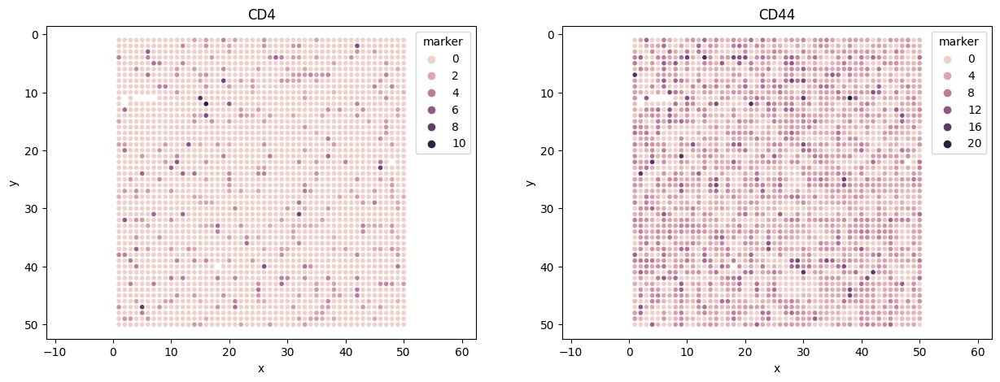

In [30]:
markers = ["CD4", "human_mouse.CD44"]
fig, axs = plt.subplots(1, len(markers), figsize=(15, 5))
for i, marker in enumerate(markers):
    plot_df = coord.copy()
    plot_df["marker"] = prot_orig[marker].to_numpy()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[i], s=20)
    axs[i].axis('equal')
    axs[i].invert_yaxis()
    axs[i].set_title(marker)
plt.show()

markers = ["CD4", "CD44"]
fig, axs = plt.subplots(1, len(markers), figsize=(15, 5))
for i, marker in enumerate(markers):
    plot_df = coord.copy()
    plot_df["marker"] = rna[marker].to_numpy()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[i], s=20)
    axs[i].axis('equal')
    axs[i].invert_yaxis()
    axs[i].set_title(marker)
plt.show()

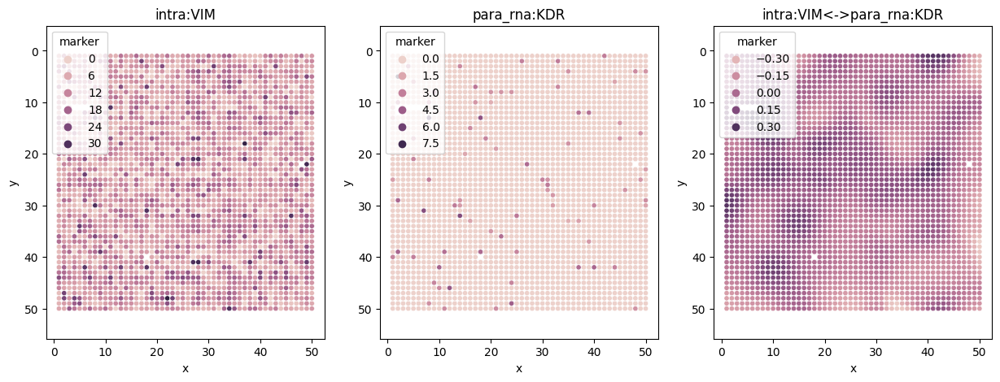

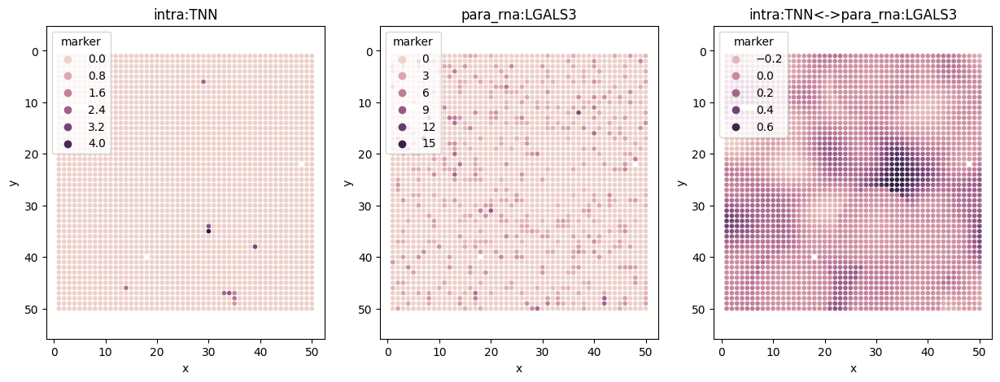

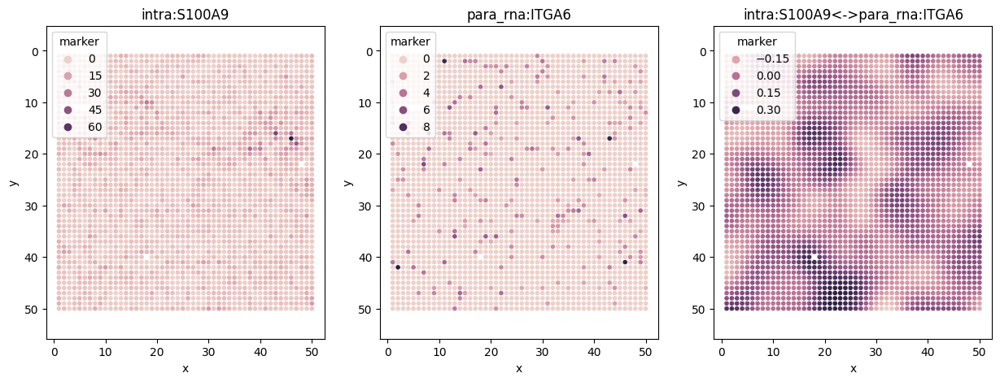

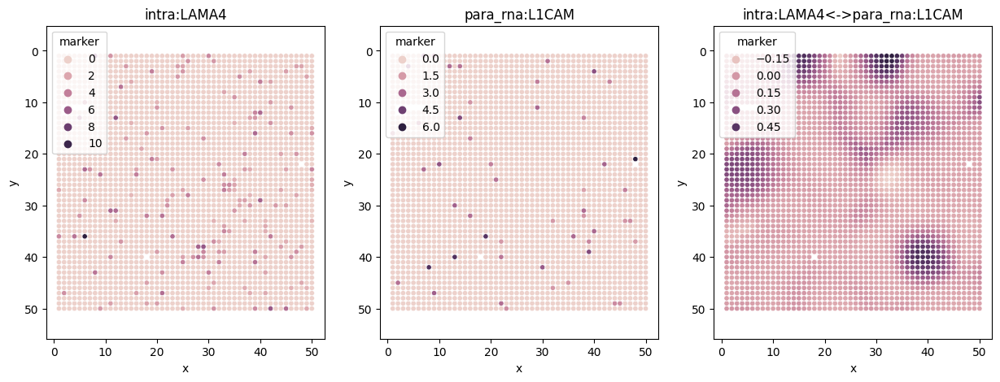

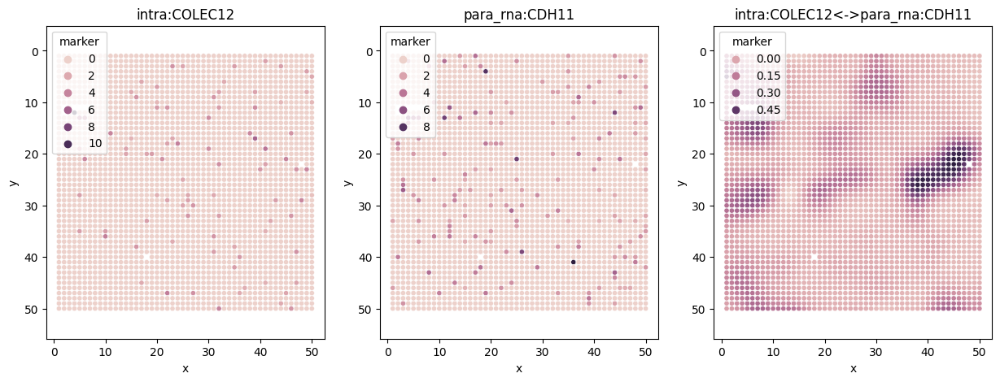

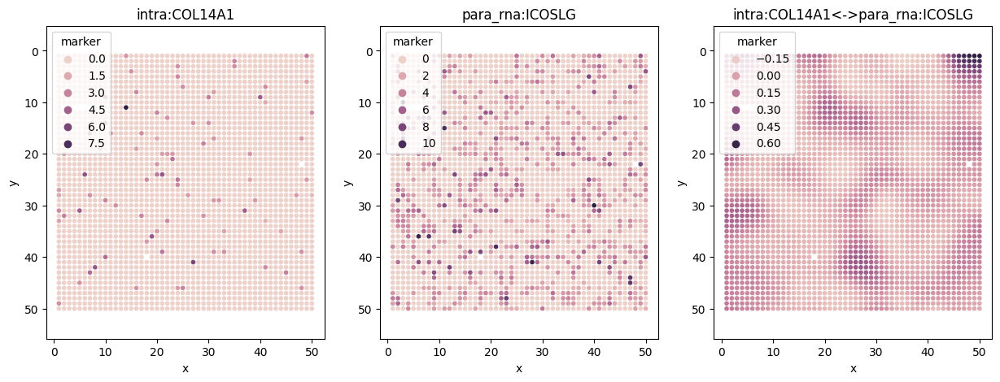

In [31]:
mdata = mu.MuData({"intra": misty.mod["intra"], "para_rna": misty.mod["para_rna"], "para_adt": misty.mod["para_adt"]})
mdata.obsm = misty.mod["para_adt"].obsm
mdata.obsp = misty.mod["para_adt"].obsp
mdata

li.mt.bivar(mdata,
            x_mod="intra",
            y_mod="para_rna",
            #x_transform=li.ut.zi_minmax,
            #y_transform=li.ut.zi_minmax,
            x_transform=sc.pp.scale,
            y_transform=sc.pp.scale,
            function_name="cosine",
            interactions=interactions_intra_rna,
            positive_only=False,
            #positive_only=True,
            add_categories=True,
            xy_sep="<->",
            )

for i in range(len(interactions_intra_rna)):
    var = mdata.mod['local_scores'].var_names[i]
    var1 = var.split("<->")[0]
    var2 = var.split("<->")[1]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    # plot intra
    plot_df = mdata.mod['intra'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['intra'][:, var1].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=20)
    axs[0].axis('equal')
    axs[0].invert_yaxis()
    axs[0].set_title(var1)

    # plot extra
    plot_df = mdata.mod['para_rna'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['para_rna'][:, var2].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=20)
    axs[1].axis('equal')
    axs[1].invert_yaxis()
    axs[1].set_title(var2)

    # plot bivariate
    plot_df = mdata.mod['local_scores'].obsm["spatial"]
    plot_df["marker"] = mdata.mod['local_scores'].X[:, i]
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[2], s=20)
    axs[2].axis('equal')
    axs[2].invert_yaxis()
    axs[2].set_title(var)

    plt.show()

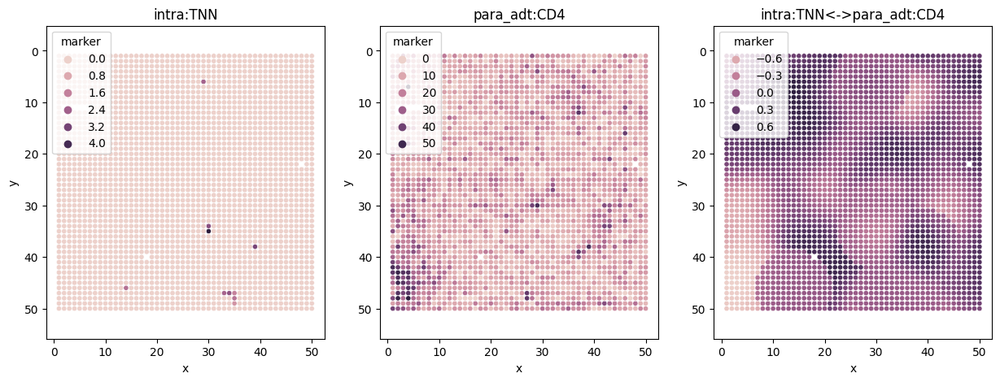

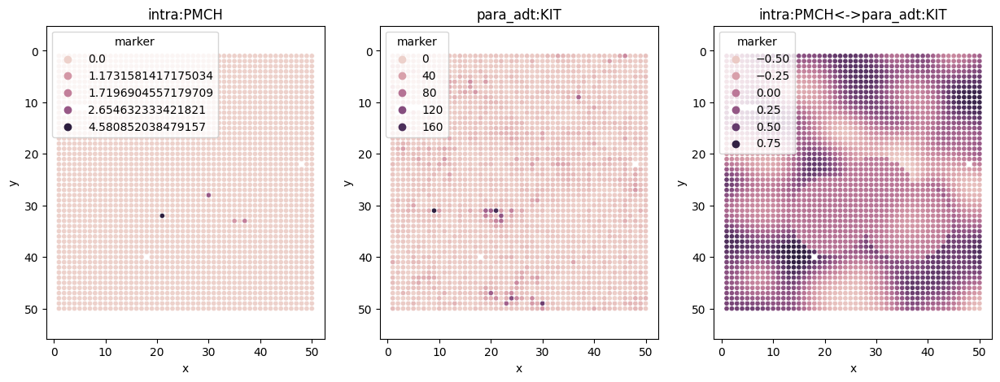

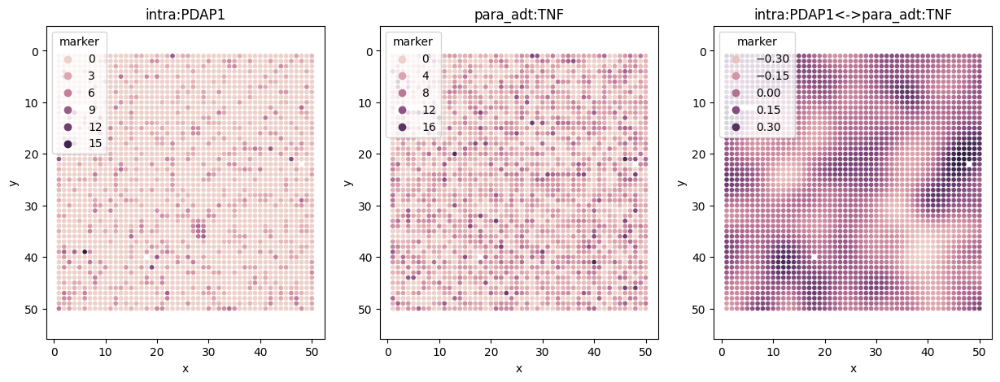

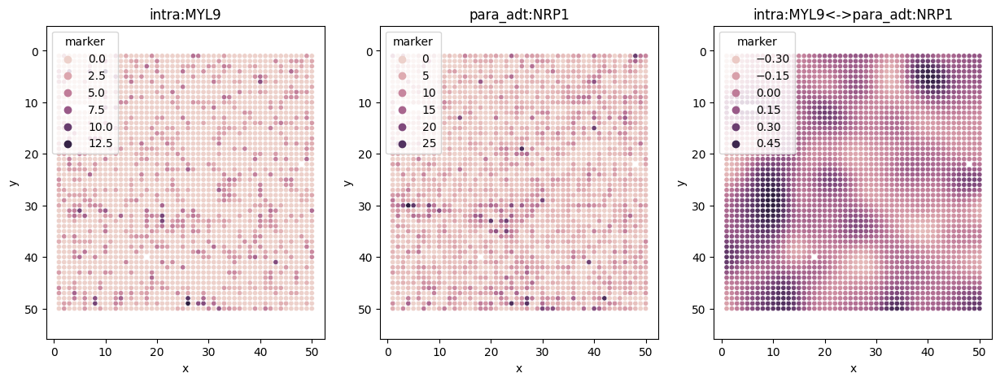

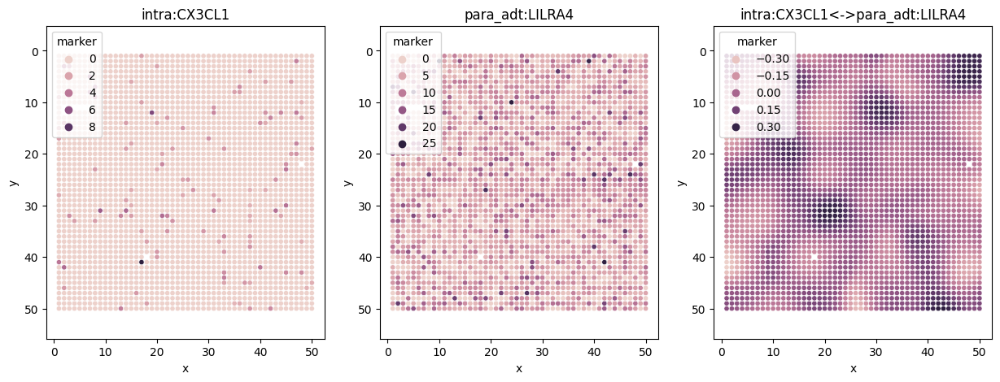

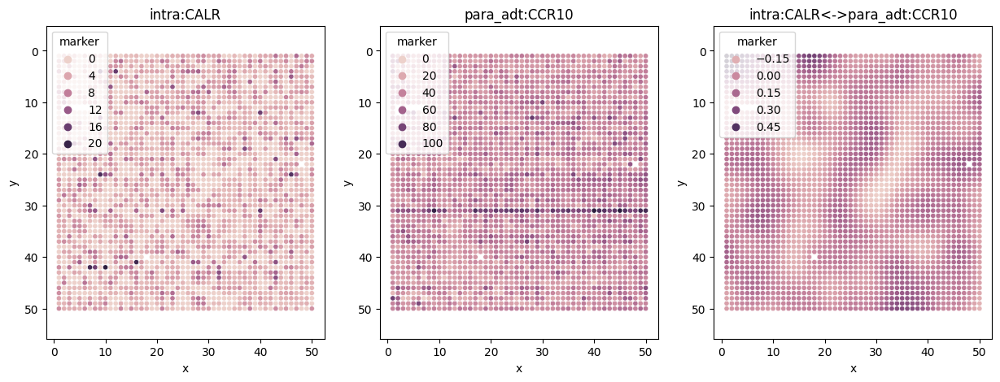

In [32]:
mdata = mu.MuData({"intra": misty.mod["intra"], "para_rna": misty.mod["para_rna"], "para_adt": misty.mod["para_adt"]})
mdata.obsm = misty.mod["para_adt"].obsm
mdata.obsp = misty.mod["para_adt"].obsp
mdata

li.mt.bivar(mdata,
            x_mod="intra",
            y_mod="para_adt",
            #x_transform=li.ut.zi_minmax,
            #y_transform=li.ut.zi_minmax,
            x_transform=sc.pp.scale,
            y_transform=sc.pp.scale,
            function_name="cosine",
            interactions=interactions_intra_adt,
            positive_only=False,
            #positive_only=True,
            add_categories=True,
            xy_sep="<->",
            )

for i in range(len(interactions_intra_adt)):
    var = mdata.mod['local_scores'].var_names[i]
    var1 = var.split("<->")[0]
    var2 = var.split("<->")[1]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    # plot intra
    plot_df = mdata.mod['intra'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['intra'][:, var1].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=20)
    axs[0].axis('equal')
    axs[0].invert_yaxis()
    axs[0].set_title(var1)

    # plot extra
    plot_df = mdata.mod['para_adt'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['para_adt'][:, var2].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=20)
    axs[1].axis('equal')
    axs[1].invert_yaxis()
    axs[1].set_title(var2)

    # plot bivariate
    plot_df = mdata.mod['local_scores'].obsm["spatial"]
    plot_df["marker"] = mdata.mod['local_scores'].X[:, i]
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[2], s=20)
    axs[2].axis('equal')
    axs[2].invert_yaxis()
    axs[2].set_title(var)

    plt.show()